IE6400 Fall 2023 Project 1: Clustering  
The objective of Project 1 is to   
a) implement different clustering methods to synthetic and real-world data and   
b) validate using external and internal validation techniques

## Task Assignment:

In [1]:
import random
from datetime import datetime
print("The current date and time is", datetime.now())

assignee = ['Liu Yining', 'Liu Mengyuan', 'Shen Chengyang']
a = ['data1','data2','data3','data4','data5','world']
random.shuffle(a)
i=0
for name in assignee:
    print('{0:15}'.format(name),' : ', a[i:(i+2)])
    i+=2

The current date and time is 2023-11-15 22:23:03.420786
Liu Yining       :  ['data5', 'world']
Liu Mengyuan     :  ['data2', 'data4']
Shen Chengyang   :  ['data3', 'data1']


## Reference

https://www.datanovia.com/en/lessons/cluster-validation-statistics-must-know-methods/

https://medium.com/@rahulkaliyath/day-12-cluster-validation-and-analysis-f66f9b2bc384

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.cluster.pair_confusion_matrix.html#sklearn.metrics.cluster.pair_confusion_matrix

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.cluster.contingency_matrix.html#sklearn.metrics.cluster.contingency_matrix

https://plotly.com/python/3d-scatter-plots/#3d-scatter-plot-with-goscatter3d

If the plotly plot doesn't shown after a while,maybe because the chrome doesn't trust jupyterlab (localhost:8888), go to setting - security, follow: https://community.plotly.com/t/plot-outputs-suddenly-missing-scatter-3d-jupyter-notebook-firefox/51139/3

In [35]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Clustering methods
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

# Evaluation metrics
from sklearn import metrics

from sklearn.metrics.cluster import contingency_matrix
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.impute import SimpleImputer
from sklearn.metrics.cluster import pair_confusion_matrix

In [34]:
def performance_internal(data, y_pred, Ctype):
    data = {'Group Sum of Square': metrics.silhouette_score(data, y_pred),
            'Calinski-Harabasz coefficient': metrics.calinski_harabasz_score(data, y_pred),
            'Dunn Index': metrics.davies_bouldin_score(data, y_pred),
           }
    df = pd.DataFrame(data=data,index=Ctype)
    return df

# Task 1

Datasets posted with the project (“Data1.csv”, “Data2.csv”, “Data3.csv”, “Data4.csv”, “Data5.csv”) contain the data points and their respective class information. For **each of the 5 datasets**, follow the steps below:
1. Use **K-means** and **hierarchical** clustering methods to generate clusters.  
2. **Evaluate the performance** of the clustering algorithm using **<font color=red>external</font> validation metrics**.  
3. **Plot (2D or 3D)** the data points for each dataset and **color** them according to the **original class**  
4. **Plot (2D or 3D)** the data points for each dataset and **color** them according to the **class allocated by each clustering algorithm**

## Data 1

### 0. import and analysis data 1

In [2]:
data1 = pd.read_csv('./Data1.csv')
display('top 5 rows:',data1.head(5))
display('bottom 5 rows:',data1.tail(5))

'top 5 rows:'

,Unnamed: 0,X1,X2,X3,Class
0,1,-4.822490,-50.402170,4.020861,1
1,2,-44.460120,20.964670,-11.492060,1
2,3,50.001020,0.780748,9.134460,1
3,4,-41.699080,-22.310060,16.314120,1
4,5,4.425242,-4.666664,50.223740,1


'bottom 5 rows:'

,Unnamed: 0,X1,X2,X3,Class
795,796,-1.531027,0.681636,0.543271,2
796,797,0.500754,-1.848209,0.605654,2
797,798,1.089574,-0.246493,-3.355758,2
798,799,-1.907717,4.964502,2.098423,2
799,800,3.415463,4.529521,-1.617736,2


In [3]:
# delete column unnamed which is meanningless
data1.drop(columns=['Unnamed: 0'],inplace=True)
data1

,X1,X2,X3,Class
0,-4.822490,-50.402170,4.020861,1
1,-44.460120,20.964670,-11.492060,1
2,50.001020,0.780748,9.134460,1
3,-41.699080,-22.310060,16.314120,1
4,4.425242,-4.666664,50.223740,1
...,...,...,...,...
795,-1.531027,0.681636,0.543271,2
796,0.500754,-1.848209,0.605654,2
797,1.089574,-0.246493,-3.355758,2
798,-1.907717,4.964502,2.098423,2


In [4]:
print('Other properties of Data 1:\n')
print('Shape:',data1.shape)
print('\nData types:')
display(data1.dtypes)
print('\nInformation:')
data1.info()

Other properties of Data 1:

Shape: (800, 4)

Data types:


X1       float64
X2       float64
X3       float64
Class      int64
dtype: object


Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      800 non-null    float64
 1   X2      800 non-null    float64
 2   X3      800 non-null    float64
 3   Class   800 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 25.1 KB


There is no null

In [5]:
data1.describe()

,X1,X2,X3,Class
count,800.000000,800.000000,800.000000,800.000000
mean,-0.611640,-0.921962,0.824385,1.500000
std,18.771445,18.472153,23.941496,0.500313
min,-49.464740,-50.461010,-50.592120,1.000000
25%,-4.443038,-4.950855,-4.424578,1.000000
50%,0.109752,-0.407613,0.537025,1.500000
75%,4.713370,3.885574,6.120185,2.000000
max,50.001020,50.598880,50.585700,2.000000


In [6]:
display(data1['Class'].value_counts())

Class
1    400
2    400
Name: count, dtype: int64

Therefore, data 1 has two classes, each class has a half records

### 1. Original Class

#### 1.1 Color the data points according to the original class

the data1 has three dimentials, need a 3-d plot to show, so use plotly which is more easier to show 3-d plots  
*the plot will disappear after a while in jupyter if the browser (chrome) doesn't trust localhost:8888

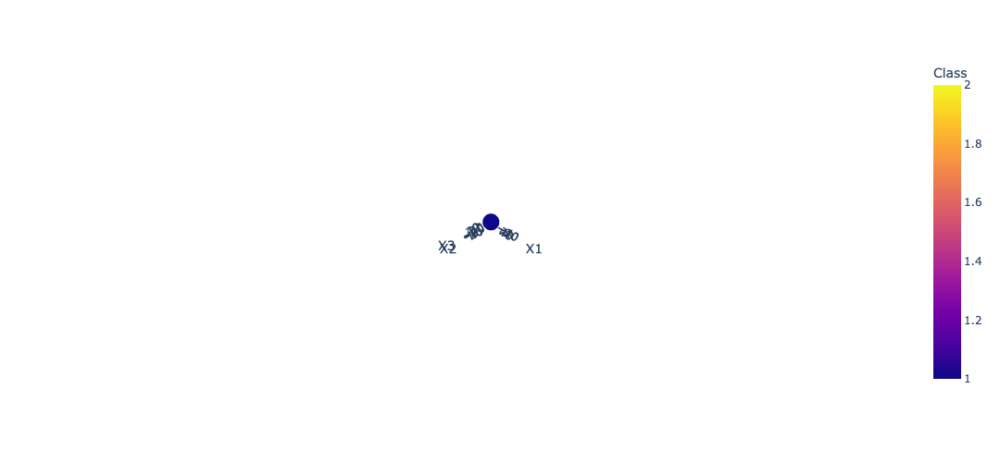

In [7]:
import plotly.express as px
fig_data1_org = px.scatter_3d(data1,x='X1',y='X2',z='X3',color='Class',width = 700, height = 500)
fig_data1_org.show() 

its screenshot：

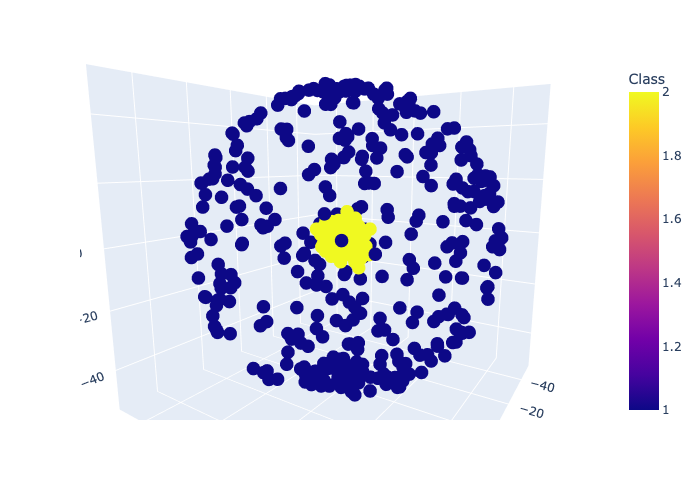

the plot shows that points of class 2  are gathered in the center, while points of class 2 are distributed around it

### 2. K-Means Clustering

#### 2.1 Choose K

loop through 1-10 clusters, running k-means for each

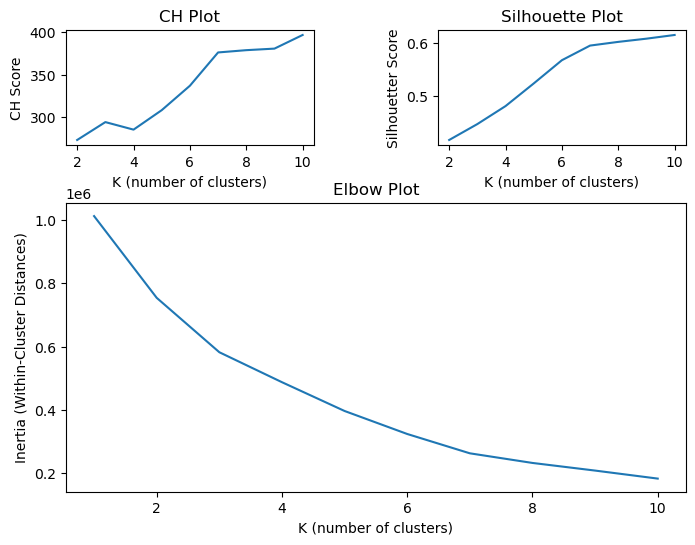

In [9]:
inertias = []
silhouettes = []
ch_coeffs = []

train_data = data1.drop(columns='Class')

for k in range(1,11):
    kmeans = KMeans(n_clusters = k, n_init = 10)
    kmeans.fit(train_data)
    inertias.append(kmeans.inertia_)
    if k>1:
        silhouettes.append(metrics.silhouette_score(train_data,kmeans.labels_))
        ch_coeffs.append(metrics.calinski_harabasz_score(train_data,kmeans.labels_))

plt.figure(figsize = (8,6))
grid = plt.GridSpec(3,2,wspace=0.5,hspace=0.5)

plt.subplot(grid[0,0])
plt.plot(range(2,11), ch_coeffs)
plt.xlabel("K (number of clusters)")
plt.ylabel("CH Score")
plt.title("CH Plot")

plt.subplot(grid[0,1])
plt.plot(range(2,11), silhouettes)
plt.xlabel('K (number of clusters)')
plt.ylabel('Silhouetter Score')
plt.title('Silhouette Plot')

plt.subplot(grid[1:,:])
plt.plot(range(1,11), inertias)
plt.xlabel("K (number of clusters)")
plt.ylabel("Inertia (Within-Cluster Distances)")
plt.title("Elbow Plot")

plt.show()

The Elbow plot does not show a very clear point that changes sharply in slope, k=2, k=3, or k=7

The silhouette plot points to k=7

The Ch plot points to k=7 as well.  

#### 2.2 external validation metrics

The contingency_matrix function output a Matrix C such that $C_{ij}$ is the number of samples in true class i and in predicted class j, there is one more step to calculate TP, FP, FN, and TN. And for precision_score(), recall_score(), and jaccard_score() is not working when dealing with situations with more than two clusters, so we will calculate those external validation scores by TP, FP, FN, and TN, which could be got by calculating combinations accoring to contingency_matrix(), or by pair_confusion_matrix() directly.  
These functions are all imported from sklearn.metrics.cluster().

###### **contingency_table(con_matrix): a func output TN, FP, FN, TN by contingency matrix:**

In [16]:
# input pd.DataFrame(contingency_matrix(true_label, pred_label))
# combination
def contingency_table(con_matrix):
    import math
    TP, FP, FN, TN = 0, 0, 0, 0
    i = con_matrix.shape[0]
    j = con_matrix.shape[1]
    
    # TP: the number of data pairs found in the same cluster, both in C and in P
    for m in range(i):
        for n in range(j):
            num = con_matrix.iloc[m,n]
            if num>1:
                TP += math.factorial(num)/(math.factorial(2)*math.factorial(num-2))
    
    #FP: the number of data pairs found in the same cluster in C but in different clusters in P
    # same column in contingency matrix, different row
    for n in range(j):
        for m in range(i):
            p = m+1
            while p <= (i-1):
                FP += con_matrix.iloc[m,n]*con_matrix.iloc[p,n]
                p+=1
    
    #FN: the number of data pairs found in different clusters in C but in the same cluster in P:
    # same row, different column
    for m in range(i):
        for n in range(j):
            p = n+1
            while p <= (j-1):
                FN += con_matrix.iloc[m,n]*con_matrix.iloc[m,p]
                p+=1
            
    #TN: the number of data pairs found in different clusters, both in C and P
    # TN = M - TP - FP - FN 
    # M = n(n-1)/2, n is the number of total points
    N = con_matrix.sum().sum()
    M = N*(N-1)/2
    TN = M - TP - FP - FN
    
    return TP, FP, FN, TN

###### external_performance_by_contingency(true_label, pred_label, n_clusters)

define a function to generate external validation measures all in one dataframe:

In [12]:
def external_performance_by_contingency(true_label, pred_label, n_clusters):
    from sklearn.metrics.cluster import contingency_matrix
    
    performance = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])
    
    TP, FP, FN, TN = contingency_table(pd.DataFrame(contingency_matrix(true_label,pred_label)))
    performance.loc[0,'Pr']= TP/(TP+FP)
    performance.loc[0,'Recall']= TP/(TP+FN)
    performance.loc[0,'J']= TP/(TP+FP+FN)
    performance.loc[0,'Rand']= (TP+TN)/(TP+TN+FP+FN)
    performance.loc[0,'FM']= ((TP/(TP+FP))*(TP/(TP+FN)))**(0.5)
    
    # rename the index by n_clusters
    performance.index = pd.Series([f'k={n_clusters}'])
    
    return performance

###### external_performance_by_pair_confusion(true_label,pred_label,n_clusters)

In [17]:
# external: precision, recall, jaccard, rand, fm
# true_label no need to be binary for pair_confusion_matrix
# true_label_binary = true_lable.replace({1:0,2:1})
# pred_label = model.labels_
def external_performance_by_pair_confusion(true_label,pred_label,n_clusters):
    from sklearn.metrics.cluster import pair_confusion_matrix
    performance = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])
    
    # C00:TN    C01:FP   C10:FN    C11:TP  
    matrix = pd.DataFrame(pair_confusion_matrix(true_label, pred_label))
    #print(f'The pair confusion matrix for k={n_clusters} is:')
    #display(matrix)
    
    TN = matrix.iloc[0,0]
    FP = matrix.iloc[0,1]
    FN = matrix.iloc[1,0]
    TP = matrix.iloc[1,1]
    performance.loc[0,'Pr']= TP/(TP+FP)
    performance.loc[0,'Recall']= TP/(TP+FN)
    performance.loc[0,'J']= TP/(TP+FP+FN)
    performance.loc[0,'Rand']= (TP+TN)/(TP+TN+FP+FN)
    performance.loc[0,'FM']= ((TP/(TP+FP))*(TP/(TP+FN)))**(0.5)
    
    # rename the index by n_clusters
    performance.index = pd.Series([f'k={n_clusters}'])
    
    #print('the performance of clustering using external validation metrics:')
    #display(performance)
    
    return performance

In [19]:
d1_k_performances_ctgc = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])
d1_k_performances_pair = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])

for k in range(2,11):
    model = KMeans(n_clusters=k,n_init=10)
    model.fit(train_data)
    
    d1_k_performances_ctgc = pd.concat([d1_k_performances_ctgc,external_performance_by_contingency(data1.loc[:,'Class'],model.labels_,k)])
    d1_k_performances_pair = pd.concat([d1_k_performances_pair,external_performance_by_pair_confusion(data1.loc[:,'Class'],model.labels_,k)])
    
display(d1_k_performances_ctgc)
display(d1_k_performances_pair)

,Pr,Recall,J,Rand,FM
k=2,0.568008,0.754643,0.479463,0.590867,0.654709
k=3,0.720116,0.670633,0.531973,0.70536,0.694934
k=4,0.777649,0.631109,0.534634,0.725673,0.700558
k=5,0.846552,0.608377,0.547951,0.749365,0.717651
k=6,0.963769,0.600013,0.586777,0.788992,0.760443
k=7,1.0,0.587663,0.587663,0.794089,0.766592
k=8,1.0,0.575533,0.575533,0.788032,0.758639
k=9,1.0,0.566253,0.566253,0.783398,0.752498
k=10,1.0,0.560144,0.560144,0.780347,0.748428


,Pr,Recall,J,Rand,FM
k=2,0.568008,0.754643,0.479463,0.590867,0.654709
k=3,0.720116,0.670633,0.531973,0.70536,0.694934
k=4,0.777649,0.631109,0.534634,0.725673,0.700558
k=5,0.846552,0.608377,0.547951,0.749365,0.717651
k=6,0.963769,0.600013,0.586777,0.788992,0.760443
k=7,1.0,0.587663,0.587663,0.794089,0.766592
k=8,1.0,0.575533,0.575533,0.788032,0.758639
k=9,1.0,0.566253,0.566253,0.783398,0.752498
k=10,1.0,0.560144,0.560144,0.780347,0.748428


In [20]:
d1_k_performances_ctgc == d1_k_performances_pair

,Pr,Recall,J,Rand,FM
k=2,True,True,True,True,True
k=3,True,True,True,True,True
k=4,True,True,True,True,True
k=5,True,True,True,True,True
k=6,True,True,True,True,True
k=7,True,True,True,True,True
k=8,True,True,True,True,True
k=9,True,True,True,True,True
k=10,True,True,True,True,True


**Therefore, the results generated from <font color='blue'>sklearn.metrics.cluster.pair_confusion_matrix</font> and from <font color='blue'>sklearn.metrics.cluster.contingency_matrix</font> are exactly the same, so we will just use pair_confusion_matrix for the whole project**

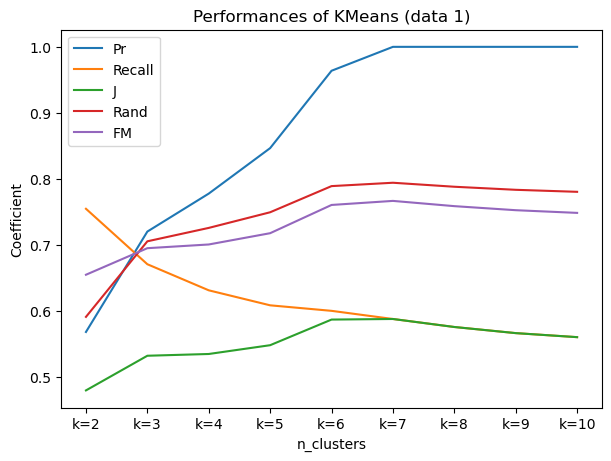

In [21]:
plt.figure(figsize=(6,4.5), layout='constrained')
for i in range(5):
    plt.plot(d1_k_performances_pair.index, d1_k_performances_pair.iloc[:,i], label=d1_k_performances_pair.columns[i])  # Plot some data on the (implicit) axes.

plt.xlabel('n_clusters')
plt.ylabel('Coefficient')
plt.title("Performances of KMeans (data 1)")
plt.legend()
plt.show()

k=7 has the best performance (run the model again ,the number might be k=6)

#### 2.3 Color the points accoring to new clusters

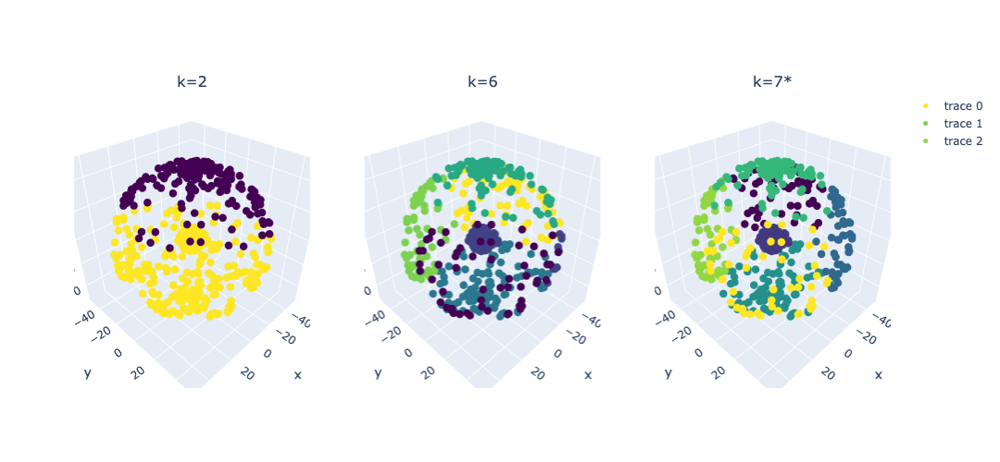

In [22]:
Ks=[2,6,7]

fig_k = make_subplots(
    rows=1, cols=3,
    subplot_titles=('k=2','k=6','k=7*'),
    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}]]
)
for i in range(len(Ks)):
    k = Ks[i]
    model = KMeans(n_clusters=k,n_init=10)
    model.fit(train_data)

    fig_k.add_trace(
        go.Scatter3d(
        x=train_data.iloc[:,0],
        y=train_data.iloc[:,1],
        z=train_data.iloc[:,2],
        mode='markers',
        marker=dict(
            size=5,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=1,col=i+1
)

fig_k.update_layout(
    autosize=False,
    width=1000,
    height=500,
)
    
fig_k.show()

### 3. Hierarchichal Clustering

In [9]:
## This is just a plotting function
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

#### 3.1 Hierarchical Clustering Dendrogram

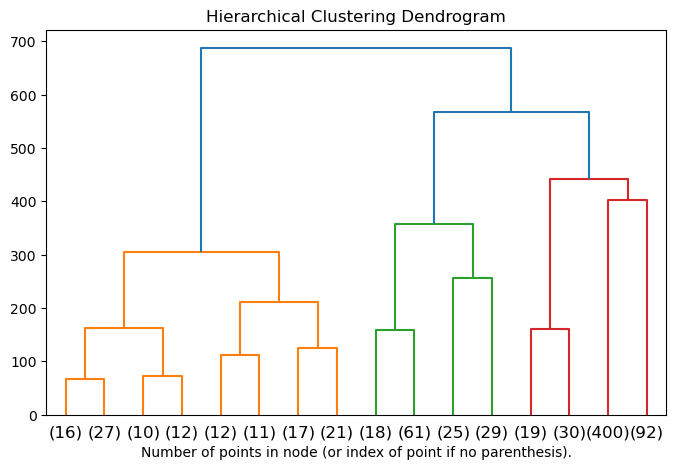

In [24]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(data1.drop(columns=["Class"]))
plt.figure(figsize=(8,5))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Like shown in elbow plot, the hierarchical clustering dendrogram shows that there are obvious decreases in distance metric when going from 1 to 2 clusters, from 2 to 3 cluster, and even from 6 to 7

In [25]:
d1_h_performances = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])

for k in range(2,11):
    model_h = AgglomerativeClustering(n_clusters=k).fit(train_data)

    d1_h_performances = pd.concat([d1_h_performances,external_performance_by_pair_confusion(data1.loc[:,'Class'],model_h.labels_,k)])
    
display(d1_h_performances)

,Pr,Recall,J,Rand,FM
k=2,0.532973,0.783684,0.464621,0.549049,0.646284
k=3,0.653399,0.666184,0.492236,0.65683,0.65976
k=4,0.734516,0.637939,0.518406,0.704052,0.684526
k=5,1.0,0.637939,0.637939,0.819196,0.798711
k=6,1.0,0.611209,0.611209,0.805848,0.781799
k=7,1.0,0.598578,0.598578,0.79954,0.773678
k=8,1.0,0.573734,0.573734,0.787134,0.757453
k=9,1.0,0.569192,0.569192,0.784865,0.754448
k=10,1.0,0.564286,0.564286,0.782416,0.75119


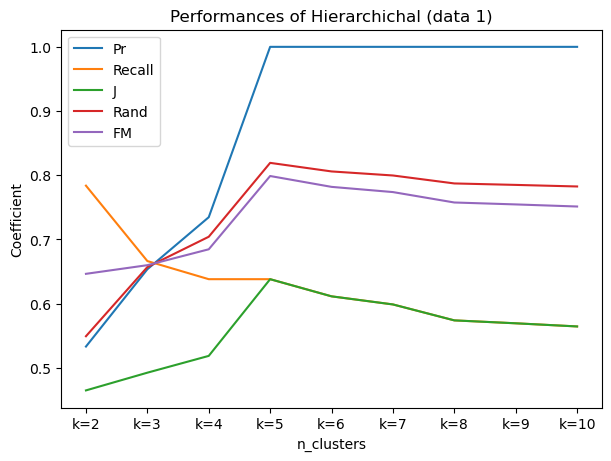

In [26]:
plt.figure(figsize=(6,4.5), layout='constrained')
for i in range(5):
    plt.plot(d1_h_performances.index, d1_h_performances.iloc[:,i], label=d1_h_performances.columns[i])  # Plot some data on the (implicit) axes.

plt.xlabel('n_clusters')
plt.ylabel('Coefficient')
plt.title("Performances of Hierarchichal (data 1)")
plt.legend()
plt.show()

k=5 has the best performance

#### 3.2 Color the points accoring to new clusters

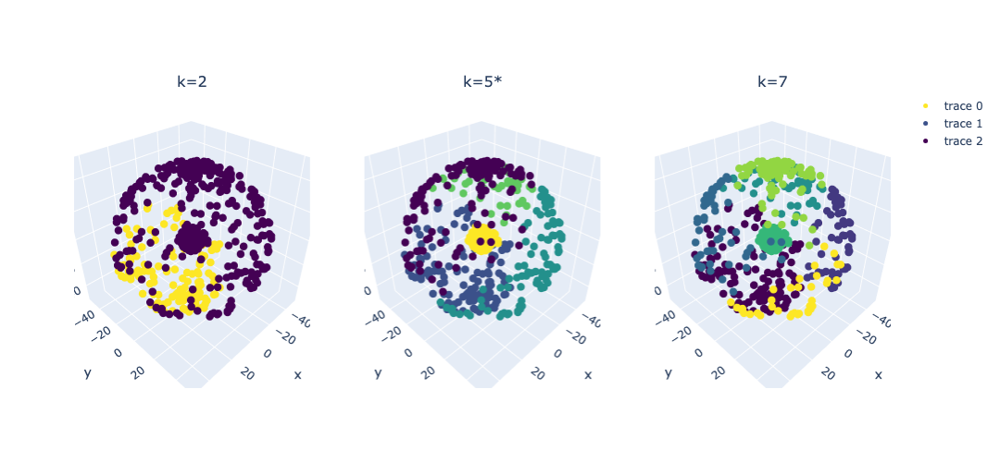

In [27]:
Ks=[2,5,7]

fig_h = make_subplots(
    rows=1, cols=3,
    subplot_titles=('k=2','k=5*','k=7'),
    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}]]
)
for i in range(len(Ks)):
    k = Ks[i]
    model = AgglomerativeClustering(n_clusters=k).fit(train_data)
    
    fig_h.add_trace(
        go.Scatter3d(
        x=train_data.iloc[:,0],
        y=train_data.iloc[:,1],
        z=train_data.iloc[:,2],
        mode='markers',
        marker=dict(
            size=5,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=1,col=i+1
)

fig_h.update_layout(
    autosize=False,
    width=1000,
    height=500,
)
    
fig_h.show()

### 4. Summary

Let's compare the two clusting method

In [29]:
d1_k_performances_pair

,Pr,Recall,J,Rand,FM
k=2,0.568008,0.754643,0.479463,0.590867,0.654709
k=3,0.720116,0.670633,0.531973,0.70536,0.694934
k=4,0.777649,0.631109,0.534634,0.725673,0.700558
k=5,0.846552,0.608377,0.547951,0.749365,0.717651
k=6,0.963769,0.600013,0.586777,0.788992,0.760443
k=7,1.0,0.587663,0.587663,0.794089,0.766592
k=8,1.0,0.575533,0.575533,0.788032,0.758639
k=9,1.0,0.566253,0.566253,0.783398,0.752498
k=10,1.0,0.560144,0.560144,0.780347,0.748428


In [30]:
d1_h_performances

,Pr,Recall,J,Rand,FM
k=2,0.532973,0.783684,0.464621,0.549049,0.646284
k=3,0.653399,0.666184,0.492236,0.65683,0.65976
k=4,0.734516,0.637939,0.518406,0.704052,0.684526
k=5,1.0,0.637939,0.637939,0.819196,0.798711
k=6,1.0,0.611209,0.611209,0.805848,0.781799
k=7,1.0,0.598578,0.598578,0.79954,0.773678
k=8,1.0,0.573734,0.573734,0.787134,0.757453
k=9,1.0,0.569192,0.569192,0.784865,0.754448
k=10,1.0,0.564286,0.564286,0.782416,0.75119


Choose the best of each one, and make a bar chart:

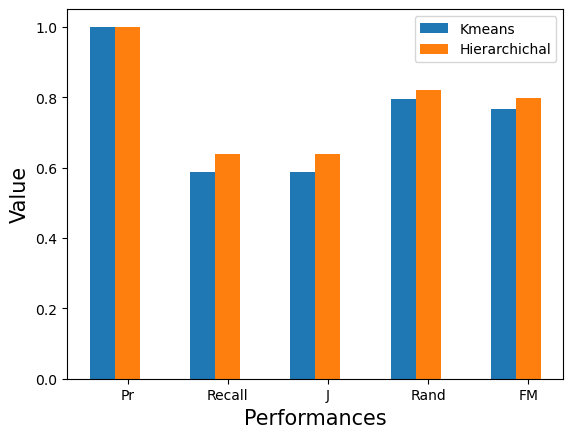

In [39]:
width = 0.25  # the width of the bars
fig = plt.subplots()
br1 = np.arange(5)
br2 = [x+width for x in br1]
plt.bar(br1, d1_k_performances_pair.iloc[5,:],width=width,label='Kmeans')
plt.bar(br2, d1_h_performances.iloc[3,:],width=width,label='Hierarchichal')

plt.xlabel('Performances',fontsize=15)
plt.ylabel('Value',fontsize=15)
plt.xticks([r+width for r in range(5)],d1_h_performances.columns)

plt.legend()
plt.show()

According to the bar chart, with the same precision, the Hierarchichal Clustering has better performance in Recall, Jaccard, Rand, and the FM coefficient, than the Kmeans Clustering

All 3d clustering plots together:

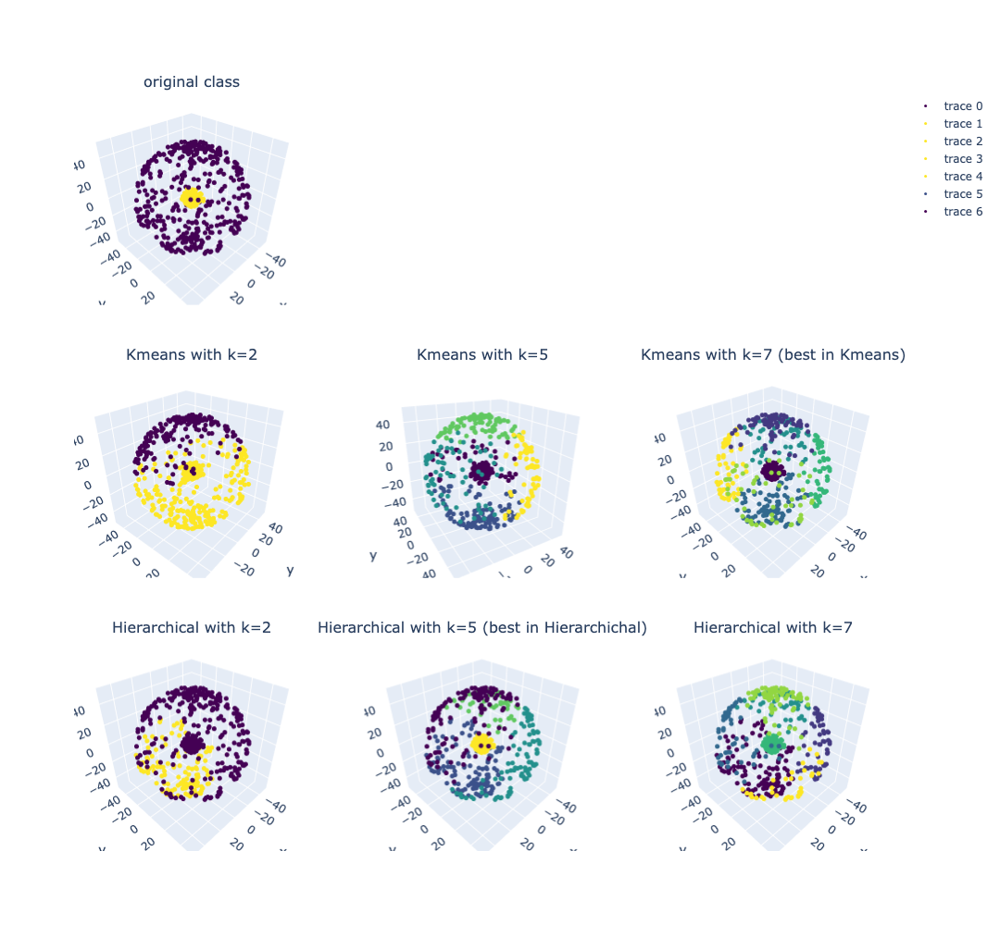

In [28]:
Ks=[2,5,7]

fig_all = make_subplots(
    rows=3, cols=3,
    subplot_titles=('original class','','','Kmeans with k=2','Kmeans with k=5','Kmeans with k=7 (best in Kmeans)','Hierarchical with k=2','Hierarchical with k=5 (best in Hierarchichal)','Hierarchical with k=7'),

    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}],
           [{"type":"scene"},{"type":"scene"},{"type":"scene"}],
           [{"type":"scene"},{"type":"scene"},{"type":"scene"}]],
    start_cell='top-left',
    #column_widths=[0.4,0.6],
    vertical_spacing=0.08
)
fig_all.add_trace(
    go.Scatter3d(
    x=train_data.iloc[:,0],
    y=train_data.iloc[:,1],
    z=train_data.iloc[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=data1.loc[:,'Class'],
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=1,col=1
)

for i in range(len(Ks)):
    k = Ks[i]
    model = KMeans(n_clusters=k,n_init=10).fit(train_data)
    
    fig_all.add_trace(
        go.Scatter3d(
        x=train_data.iloc[:,0],
        y=train_data.iloc[:,1],
        z=train_data.iloc[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=2,col=i+1
)

for i in range(len(Ks)):
    k = Ks[i]
    model = AgglomerativeClustering(n_clusters=k).fit(train_data)
    
    fig_all.add_trace(
        go.Scatter3d(
        x=train_data.iloc[:,0],
        y=train_data.iloc[:,1],
        z=train_data.iloc[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=3,col=i+1
)

fig_all.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)
    
fig_all.show()

## Data 2

## Data 3

### 0. Import and tidy data
Remove the original meaningless index column.

In [4]:
data3 = pd.read_csv('./Data3.csv')
data3.drop(columns=['Unnamed: 0'],inplace=True)
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      400 non-null    float64
 1   X2      400 non-null    float64
 2   X3      400 non-null    float64
 3   Class   400 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 12.6 KB


### 1a. Using k-means clustering method to generate clusters
We check the performance through three internal coefficients from 2 clusters to 10 clusters to determine the k-value we going to use.

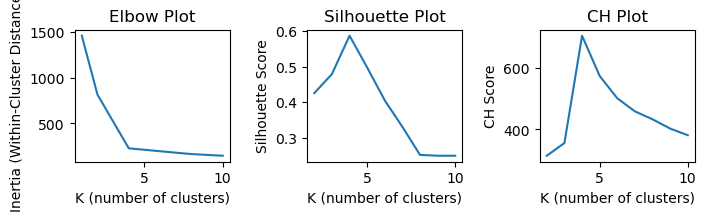

In [5]:
inertias = []
silhouettes = []
ch_coeffs = []

for k in range(1,11):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(data3)
    inertias.append(kmeans.inertia_)
    if k > 1:
      silhouettes.append(metrics.silhouette_score(data3, kmeans.labels_))
      ch_coeffs.append(metrics.calinski_harabasz_score(data3, kmeans.labels_))

plt.figure(figsize = (8,6))
grid = plt.GridSpec(2,3,wspace=0.5,hspace=1.5)

plt.subplot(grid[0,0])
plt.plot(range(1,11), inertias)
plt.xlabel("K (number of clusters)")
plt.ylabel("Inertia (Within-Cluster Distances)")
plt.title("Elbow Plot")

plt.subplot(grid[0,1])
plt.plot(range(2,11), silhouettes)
plt.xlabel("K (number of clusters)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Plot")

plt.subplot(grid[0,2])
plt.plot(range(2,11), ch_coeffs)
plt.xlabel("K (number of clusters)")
plt.ylabel("CH Score")
plt.title("CH Plot")

plt.show()

From the plot we can find out that all three coefficients indicate we should take k=4 for clustering.

In [6]:
modelK3 = KMeans(n_clusters=4, n_init=10)
modelK3.fit(data3)

KMeans(n_clusters=4, n_init=10)

### 1b. Using hierarchical clustering method to generate clusters

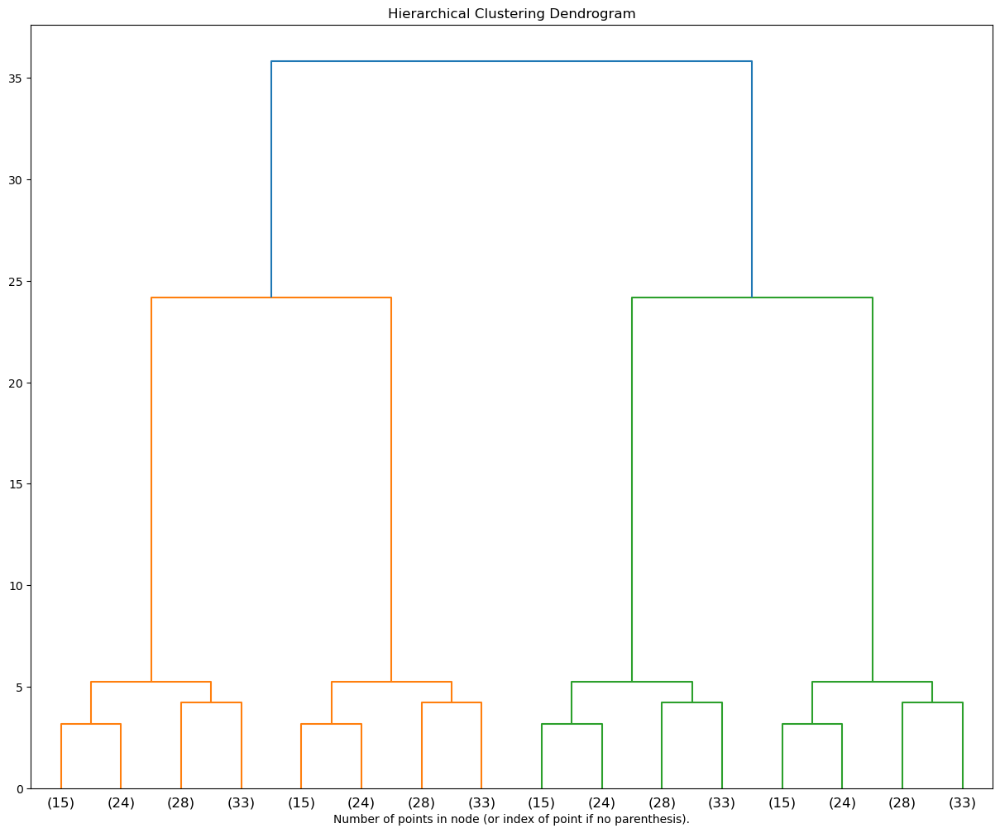

In [11]:
model3 = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model3 = model3.fit(data3)
plt.figure(figsize=(15,12))
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model3, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

The graph indicates that taking k=4 would have a good clustering performance.

In [12]:
modelH3 = AgglomerativeClustering(n_clusters=4)
modelH3.fit(data3)

AgglomerativeClustering(n_clusters=4)

### 2. Evaluate the performance of the clustering
We use 6 different index to evaluate how our clustering performing well.

In [13]:
def purity_score(y_true, y_pred):
    # compute contingency matrix (also called confusion matrix)
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
    # return purity
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

In [14]:
def performance(y_true, y_pred,Ctype):
    TP, FP, FN, TN = contingency_table(pd.DataFrame(contingency_matrix(y_true,y_pred)))
    data = {'Precision': TP/(TP+FP),
            'Recall': TP/(TP+FN),
            'Purity': purity_score(y_true,y_pred),
            'Jarrard': TP/(TP+FP+FN),
            'Rand': metrics.rand_score(y_true,y_pred),
            'Folkes and Mallow': metrics.fowlkes_mallows_score(y_true,y_pred)
           }
    df = pd.DataFrame(data=data,index=Ctype)
    return df

In [19]:
pd.concat([performance(data3.loc[:,'Class'],modelK3.labels_,['KMeans']),performance(data3.loc[:,'Class'],modelH3.labels_,['Hierarchical'])])

,Precision,Recall,Purity,Jarrard,Rand,Folkes and Mallow
KMeans,1.0,1.0,1.0,1.0,1.0,1.0
Hierarchical,1.0,1.0,1.0,1.0,1.0,1.0


Since the origin classification uses 4 classes, we obtained a perfect cluster for both method using k=4.

### 3. Plot the data points and color them according to the original and clustered class

In [23]:
fig3 = make_subplots(
    rows=1, cols=3,
    subplot_titles=('Original','KMeans','Hierarchical'),
    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}]]
)
fig3.add_trace(
    go.Scatter3d(
    x=data3.iloc[:,0],
    y=data3.iloc[:,1],
    z=data3.iloc[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=data3.loc[:,"Class"],
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=1
)
fig3.add_trace(
    go.Scatter3d(
    x=data3.iloc[:,0],
    y=data3.iloc[:,1],
    z=data3.iloc[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=modelK3.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=2
)
fig3.add_trace(
    go.Scatter3d(
    x=data3.iloc[:,0],
    y=data3.iloc[:,1],
    z=data3.iloc[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=modelH3.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=3
)
fig3.update_layout()
fig3.show()

## Data 4

## Data 5

### 0. import and analysis data 5

In [26]:
data5 = pd.read_csv('./Data5.csv')
display('top 5 rows:',data5.head(5))
display('bottom 5 rows:',data5.tail(5))

'top 5 rows:'

,Unnamed: 0,X1,X2,X3,Class
0,1,-0.063274,0.027734,0.022683,1
1,2,-0.000731,0.048211,0.069198,1
2,3,-0.060767,-0.009080,0.053085,1
3,4,0.013252,-0.011876,0.055324,1
4,5,-0.054508,-0.003813,0.001738,1


'bottom 5 rows:'

,Unnamed: 0,X1,X2,X3,Class
207,208,0.175738,-0.053478,-2.733752,7
208,209,0.396046,-0.858377,-3.126866,7
209,210,-0.406362,-0.334541,-2.885598,7
210,211,-0.299275,0.071281,-3.642585,7
211,212,-0.506192,0.433538,-2.608597,7


In [27]:
# delete column unnamed which is meanningless
data5.drop(columns=['Unnamed: 0'],inplace=True)
data5

,X1,X2,X3,Class
0,-0.063274,0.027734,0.022683,1
1,-0.000731,0.048211,0.069198,1
2,-0.060767,-0.009080,0.053085,1
3,0.013252,-0.011876,0.055324,1
4,-0.054508,-0.003813,0.001738,1
...,...,...,...,...
207,0.175738,-0.053478,-2.733752,7
208,0.396046,-0.858377,-3.126866,7
209,-0.406362,-0.334541,-2.885598,7
210,-0.299275,0.071281,-3.642585,7


In [28]:
print('Other properties of Data 5:\n')
print('Shape:',data5.shape)
print('\nData types:')
display(data5.dtypes)
print('\nInformation:')
data5.info()

Other properties of Data 5:

Shape: (212, 4)

Data types:


X1       float64
X2       float64
X3       float64
Class      int64
dtype: object


Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 212 entries, 0 to 211
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      212 non-null    float64
 1   X2      212 non-null    float64
 2   X3      212 non-null    float64
 3   Class   212 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 6.8 KB


There is no null

In [29]:
data5.describe()

,X1,X2,X3,Class
count,212.000000,212.000000,212.000000,212.000000
mean,0.015418,0.034183,-0.035626,3.971698
std,1.647716,1.670505,1.628822,2.016320
min,-3.970394,-3.881493,-3.909294,1.000000
25%,-0.407496,-0.476732,-0.423145,2.000000
50%,-0.003762,-0.004597,0.021322,4.000000
75%,0.438729,0.500722,0.384359,6.000000
max,3.747710,3.774495,3.899389,7.000000


In [30]:
display(data5['Class'].value_counts())

Class
1    32
2    30
3    30
4    30
5    30
6    30
7    30
Name: count, dtype: int64

Therefore, data 5 has 7 classes

### 1. Original Class

#### 1.1 Color the data points according to the original class

use plotly to draw a 3-d plot

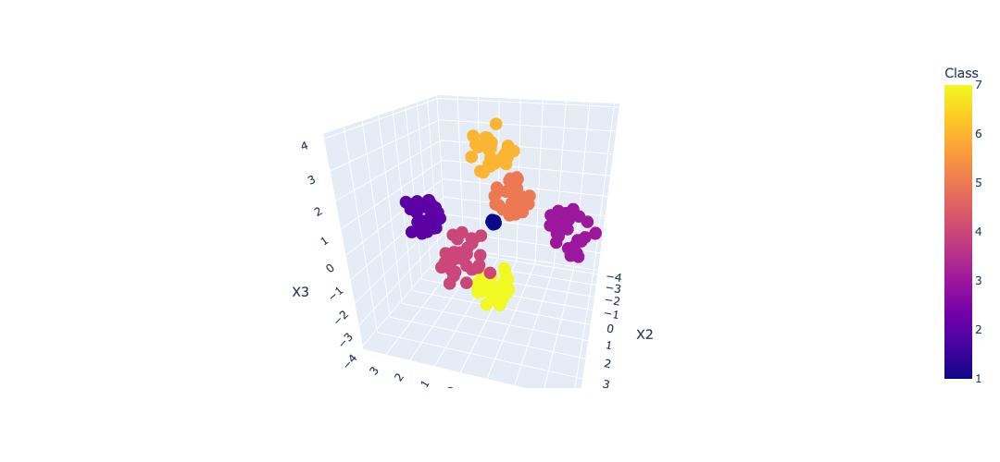

In [31]:
import plotly.express as px
fig_data5_org = px.scatter_3d(data5,x='X1',y='X2',z='X3',color='Class',width = 700, height = 500)
fig_data5_org.show()                    

(if the above output is blank, please run the code again or just look at its screeenshot:)

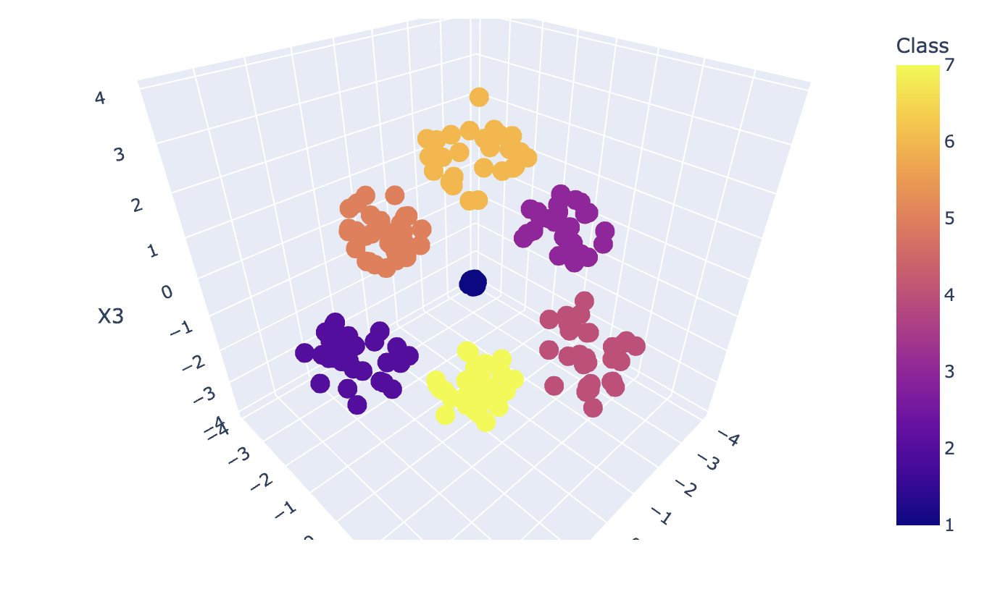

the plot shows that points of class 1  are gathered very closely in the center, while points of other classes are distributed around it, and each group is gethered pretty closely but not as tight as class 1 

### 2. K-Means Clustering

#### 2.1 Choose K

loop through 1-10 clusters, running k-means for each

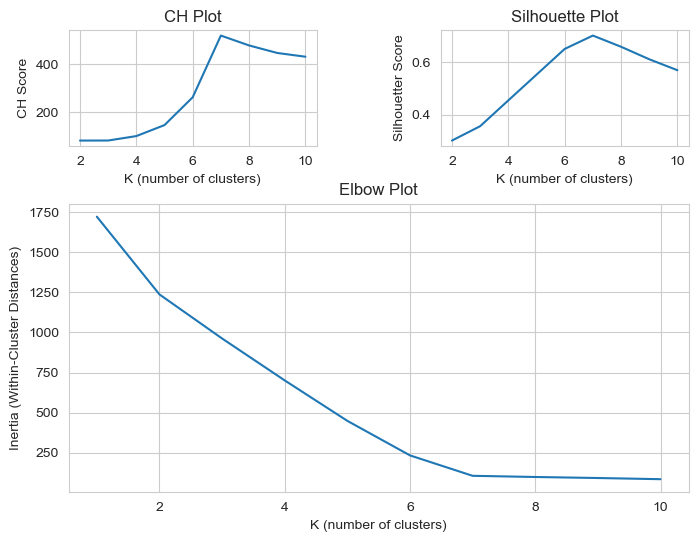

In [33]:
inertias = []
silhouettes = []
ch_coeffs = []

train_data5 = data5.drop(columns='Class')

for k in range(1,11):
    kmeans = KMeans(n_clusters = k, n_init = 10)
    kmeans.fit(train_data5)
    inertias.append(kmeans.inertia_)
    if k>1:
        silhouettes.append(metrics.silhouette_score(train_data5,kmeans.labels_))
        ch_coeffs.append(metrics.calinski_harabasz_score(train_data5,kmeans.labels_))

plt.figure(figsize = (8,6))
grid = plt.GridSpec(3,2,wspace=0.5,hspace=0.5)

plt.subplot(grid[0,0])
plt.plot(range(2,11), ch_coeffs)
plt.xlabel("K (number of clusters)")
plt.ylabel("CH Score")
plt.title("CH Plot")

plt.subplot(grid[0,1])
plt.plot(range(2,11), silhouettes)
plt.xlabel('K (number of clusters)')
plt.ylabel('Silhouetter Score')
plt.title('Silhouette Plot')

plt.subplot(grid[1:,:])
plt.plot(range(1,11), inertias)
plt.xlabel("K (number of clusters)")
plt.ylabel("Inertia (Within-Cluster Distances)")
plt.title("Elbow Plot")

plt.show()

The Elbow plot touches the bottom and tends to be stable at point of k=7, the silhouette plot and CH plot both reach to the top at k=7 as well, so the result is very clear that k=7 is the best choice here

Let's look at the other performances

#### 2.2 external validation metrics

the performance function is the same as in data1, and for convenience, we will just use pair confusion matrix, just show below: 

In [36]:
# external: precision, recall, jaccard, rand, fm
# true_label no need to be binary for pair_confusion_matrix
# true_label_binary = true_lable.replace({1:0,2:1})
# pred_label = model.labels_
def external_performance_by_pair_confusion(true_label,pred_label,n_clusters):
    performance = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])
    
    # C00:TN    C01:FP   C10:FN    C11:TP  
    matrix = pd.DataFrame(pair_confusion_matrix(true_label, pred_label))
    print(f'The pair confusion matrix for k={n_clusters} is:')
    display(matrix)
    
    TN = matrix.iloc[0,0]
    FP = matrix.iloc[0,1]
    FN = matrix.iloc[1,0]
    TP = matrix.iloc[1,1]
    performance.loc[0,'Pr']= TP/(TP+FP)
    performance.loc[0,'Recall']= TP/(TP+FN)
    performance.loc[0,'J']= TP/(TP+FP+FN)
    performance.loc[0,'Rand']= (TP+TN)/(TP+TN+FP+FN)
    performance.loc[0,'FM']= ((TP/(TP+FP))*(TP/(TP+FN)))**(0.5)
    
    # rename the index by n_clusters
    performance.index = pd.Series([f'k={n_clusters}'])
    
    #print('the performance of clustering using external validation metrics:')
    #display(performance)
    
    return performance

In [37]:
d5_k_performances = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])

for k in range(2,11):
    model = KMeans(n_clusters=k,n_init=10)
    model.fit(train_data5)
    
    d5_k_performances = pd.concat([d5_k_performances,external_performance_by_pair_confusion(data5.loc[:,'Class'],model.labels_,k)])
    
display(d5_k_performances)

The pair confusion matrix for k=2 is:


,0,1
0,21960,16560
1,0,6212


The pair confusion matrix for k=3 is:


,0,1
0,25560,12960
1,0,6212


The pair confusion matrix for k=4 is:


,0,1
0,27360,11160
1,0,6212


The pair confusion matrix for k=5 is:


,0,1
0,32880,5640
1,0,6212


The pair confusion matrix for k=6 is:


,0,1
0,36600,1920
1,0,6212


The pair confusion matrix for k=7 is:


,0,1
0,38520,0
1,0,6212


The pair confusion matrix for k=8 is:


,0,1
0,38520,0
1,448,5764


The pair confusion matrix for k=9 is:


,0,1
0,38520,0
1,866,5346


The pair confusion matrix for k=10 is:


,0,1
0,38520,0
1,1322,4890


,Pr,Recall,J,Rand,FM
k=2,0.272791,1.0,0.272791,0.629795,0.522294
k=3,0.324014,1.0,0.324014,0.710275,0.569222
k=4,0.357587,1.0,0.357587,0.750514,0.597986
k=5,0.524131,1.0,0.524131,0.873916,0.723969
k=6,0.763896,1.0,0.763896,0.957078,0.874011
k=7,1.0,1.0,1.0,1.0,1.0
k=8,1.0,0.927882,0.927882,0.989985,0.963266
k=9,1.0,0.860592,0.860592,0.98064,0.927681
k=10,1.0,0.787186,0.787186,0.970446,0.887235


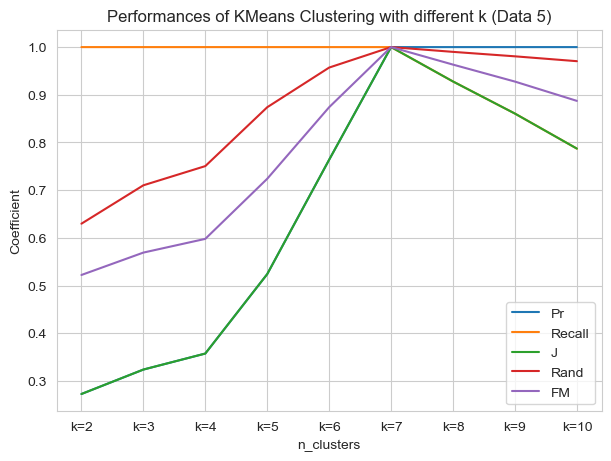

In [38]:
plt.figure(figsize=(6,4.5), layout='constrained')
for i in range(5):
    plt.plot(d5_k_performances.index, d5_k_performances.iloc[:,i], label=d5_k_performances.columns[i])  # Plot some data on the (implicit) axes.

plt.xlabel('n_clusters')
plt.ylabel('Coefficient')
plt.title("Performances of KMeans Clustering with different k (Data 5)")
plt.legend()
plt.show()

the lines of precision, Jaccard, Rand and FM coefficients all reach to the top at the point of k=7, and recall start decreasing at k=7 as well, so without doubt, k=7 has the best performance

What about plots with smaller Pr or recalls:

#### 2.3 Color the points accoring to new clusters

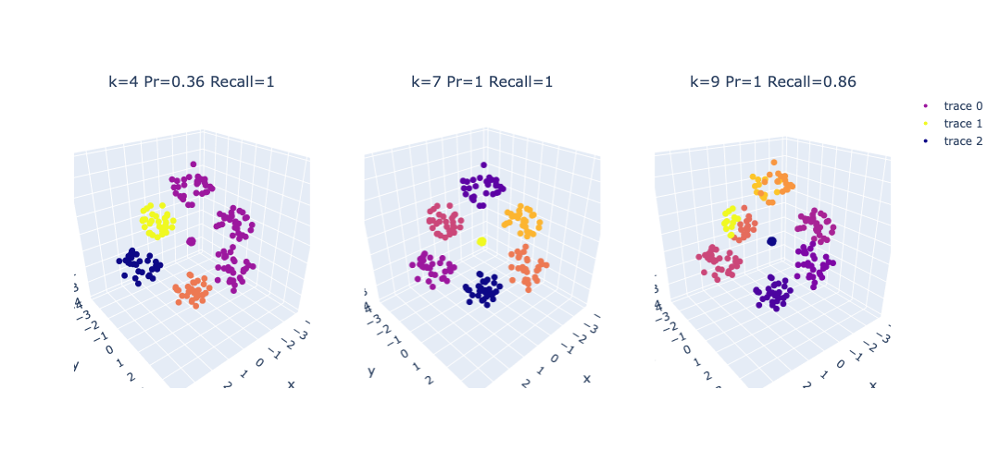

In [42]:
Ks=[4,7,9]
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig_k = make_subplots(
    rows=1, cols=3,
    subplot_titles=('k=4 Pr=0.36 Recall=1','k=7 Pr=1 Recall=1','k=9 Pr=1 Recall=0.86'),
    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}]]
)
for i in range(len(Ks)):
    k = Ks[i]
    model = KMeans(n_clusters=k,n_init=10)
    model.fit(train_data5)

    fig_k.add_trace(
        go.Scatter3d(
        x=train_data5.iloc[:,0],
        y=train_data5.iloc[:,1],
        z=train_data5.iloc[:,2],
        mode='markers',
        marker=dict(
            size=4,
            color=model.labels_,
        opacity=1
        )
    ),
        row=1,col=i+1
)

fig_k.update_layout(
    autosize=False,
    width=1000,
    height=500,
)
    
fig_k.show()

(its screenshot:)

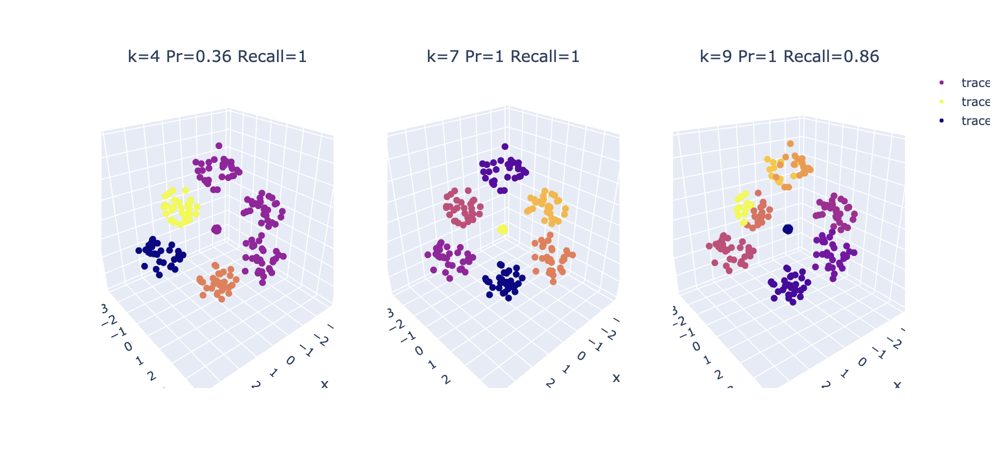

when k=7, the clustering is just as the same as the original class. The third clustering with a smaller recall is similar to the second one, on the base of k=7, but with more division in the classes that are distributed around the class at the center

### 3. Hierarchichal Clustering

same function in the data1 to plot dendrogram, just show below:

In [22]:
## This is just a plotting function
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

#### 3.1 Hierarchical Clustering Dendrogram

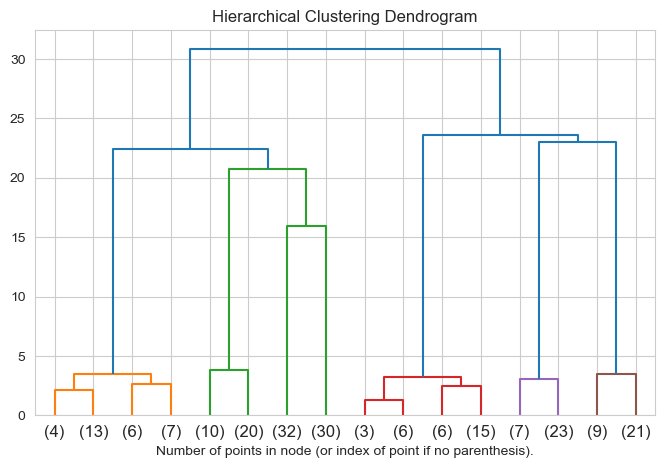

In [43]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(data5.drop(columns=["Class"]))
plt.figure(figsize=(8,5))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

From above, it's like that the k could be 2, 4, 6

#### 3.2 external validation metrics

In [44]:
d5_h_performances = pd.DataFrame(columns=['Pr', 'Recall', 'J', 'Rand', 'FM'])

for k in range(2,11):
    model_h = AgglomerativeClustering(n_clusters=k).fit(train_data5)

    d5_h_performances = pd.concat([d5_h_performances,external_performance_by_pair_confusion(data5.loc[:,'Class'],model_h.labels_,k)])
    
display(d5_h_performances)

The pair confusion matrix for k=2 is:


,0,1
0,21960,16560
1,0,6212


The pair confusion matrix for k=3 is:


,0,1
0,25560,12960
1,0,6212


The pair confusion matrix for k=4 is:


,0,1
0,27360,11160
1,0,6212


The pair confusion matrix for k=5 is:


,0,1
0,32880,5640
1,0,6212


The pair confusion matrix for k=6 is:


,0,1
0,36600,1920
1,0,6212


The pair confusion matrix for k=7 is:


,0,1
0,38520,0
1,0,6212


The pair confusion matrix for k=8 is:


,0,1
0,38520,0
1,442,5770


The pair confusion matrix for k=9 is:


,0,1
0,38520,0
1,842,5370


The pair confusion matrix for k=10 is:


,0,1
0,38520,0
1,1284,4928


,Pr,Recall,J,Rand,FM
k=2,0.272791,1.0,0.272791,0.629795,0.522294
k=3,0.324014,1.0,0.324014,0.710275,0.569222
k=4,0.357587,1.0,0.357587,0.750514,0.597986
k=5,0.524131,1.0,0.524131,0.873916,0.723969
k=6,0.763896,1.0,0.763896,0.957078,0.874011
k=7,1.0,1.0,1.0,1.0,1.0
k=8,1.0,0.928847,0.928847,0.990119,0.963767
k=9,1.0,0.864456,0.864456,0.981177,0.929761
k=10,1.0,0.793303,0.793303,0.971296,0.890676


It looks like the same as what we got in the kmeans clustering, let's have a look:

In [45]:
d5_h_performances == d5_k_performances

,Pr,Recall,J,Rand,FM
k=2,True,True,True,True,True
k=3,True,True,True,True,True
k=4,True,True,True,True,True
k=5,True,True,True,True,True
k=6,True,True,True,True,True
k=7,True,True,True,True,True
k=8,True,False,False,False,False
k=9,True,False,False,False,False
k=10,True,False,False,False,False


interesting, the two performances are almost the same when k<=7

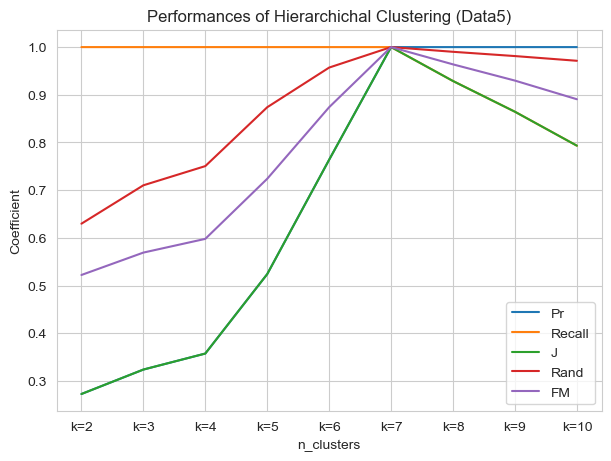

In [46]:
plt.figure(figsize=(6,4.5), layout='constrained')
for i in range(5):
    plt.plot(d5_h_performances.index, d5_h_performances.iloc[:,i], label=d5_h_performances.columns[i])  # Plot some data on the (implicit) axes.

plt.xlabel('n_clusters')
plt.ylabel('Coefficient')
plt.title("Performances of Hierarchichal Clustering (Data5)")
plt.legend()
plt.show()

k=7 has the best performance

#### 3.2 Color the points accoring to new clusters

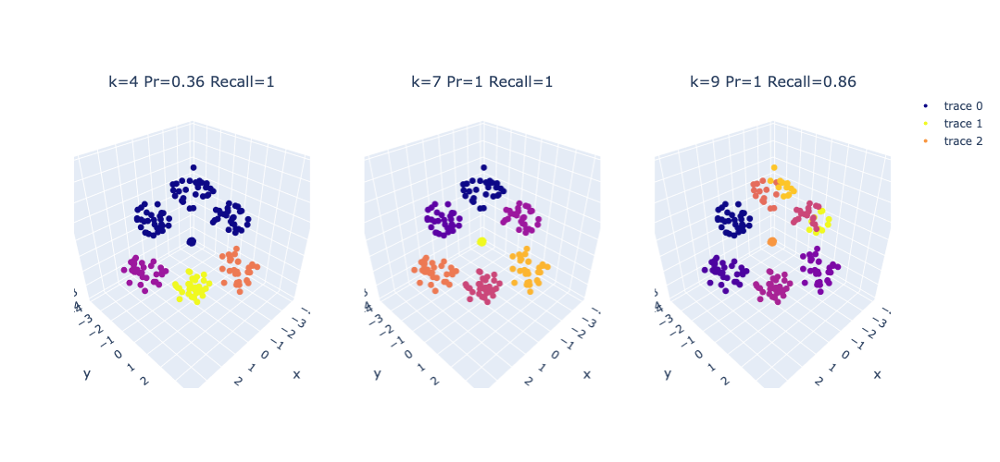

In [47]:
Ks=[4,7,9]

fig_h = make_subplots(
    rows=1, cols=3,
    subplot_titles=('k=4 Pr=0.36 Recall=1','k=7 Pr=1 Recall=1','k=9 Pr=1 Recall=0.86'),
    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}]]
)
for i in range(len(Ks)):
    k = Ks[i]
    model = AgglomerativeClustering(n_clusters=k).fit(train_data5)
    
    fig_h.add_trace(
        go.Scatter3d(
        x=train_data5.iloc[:,0],
        y=train_data5.iloc[:,1],
        z=train_data5.iloc[:,2],
        mode='markers',
        marker=dict(
            size=4,
            color=model.labels_,
        #colorscale='Viridis',
        opacity=1
        )
    ),
        row=1,col=i+1
)

fig_h.update_layout(
    autosize=False,
    width=1000,
    height=500,
)
    
fig_h.show()

### 4. Summary

Let's compare the two clusting method

In [48]:
d5_k_performances

,Pr,Recall,J,Rand,FM
k=2,0.272791,1.0,0.272791,0.629795,0.522294
k=3,0.324014,1.0,0.324014,0.710275,0.569222
k=4,0.357587,1.0,0.357587,0.750514,0.597986
k=5,0.524131,1.0,0.524131,0.873916,0.723969
k=6,0.763896,1.0,0.763896,0.957078,0.874011
k=7,1.0,1.0,1.0,1.0,1.0
k=8,1.0,0.927882,0.927882,0.989985,0.963266
k=9,1.0,0.860592,0.860592,0.98064,0.927681
k=10,1.0,0.787186,0.787186,0.970446,0.887235


In [49]:
d5_h_performances

,Pr,Recall,J,Rand,FM
k=2,0.272791,1.0,0.272791,0.629795,0.522294
k=3,0.324014,1.0,0.324014,0.710275,0.569222
k=4,0.357587,1.0,0.357587,0.750514,0.597986
k=5,0.524131,1.0,0.524131,0.873916,0.723969
k=6,0.763896,1.0,0.763896,0.957078,0.874011
k=7,1.0,1.0,1.0,1.0,1.0
k=8,1.0,0.928847,0.928847,0.990119,0.963767
k=9,1.0,0.864456,0.864456,0.981177,0.929761
k=10,1.0,0.793303,0.793303,0.971296,0.890676


As conclusion we have made before, the two performances are almost the same, the two clustering both do the best when k=7

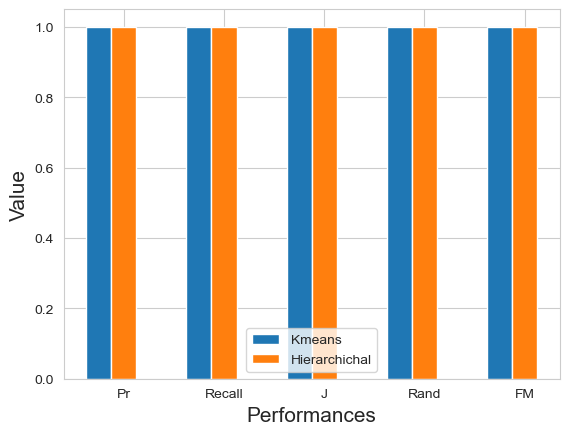

In [51]:
width = 0.25  # the width of the bars
fig = plt.subplots()
br1 = np.arange(5)
br2 = [x+width for x in br1]
plt.bar(br1, d5_k_performances.iloc[5,:],width=width,label='Kmeans')
plt.bar(br2, d5_h_performances.iloc[5,:],width=width,label='Hierarchichal')

plt.xlabel('Performances',fontsize=15)
plt.ylabel('Value',fontsize=15)
plt.xticks([r+width for r in range(5)],d5_h_performances.columns)

plt.legend()
plt.show()

All 3d clustering plots together:

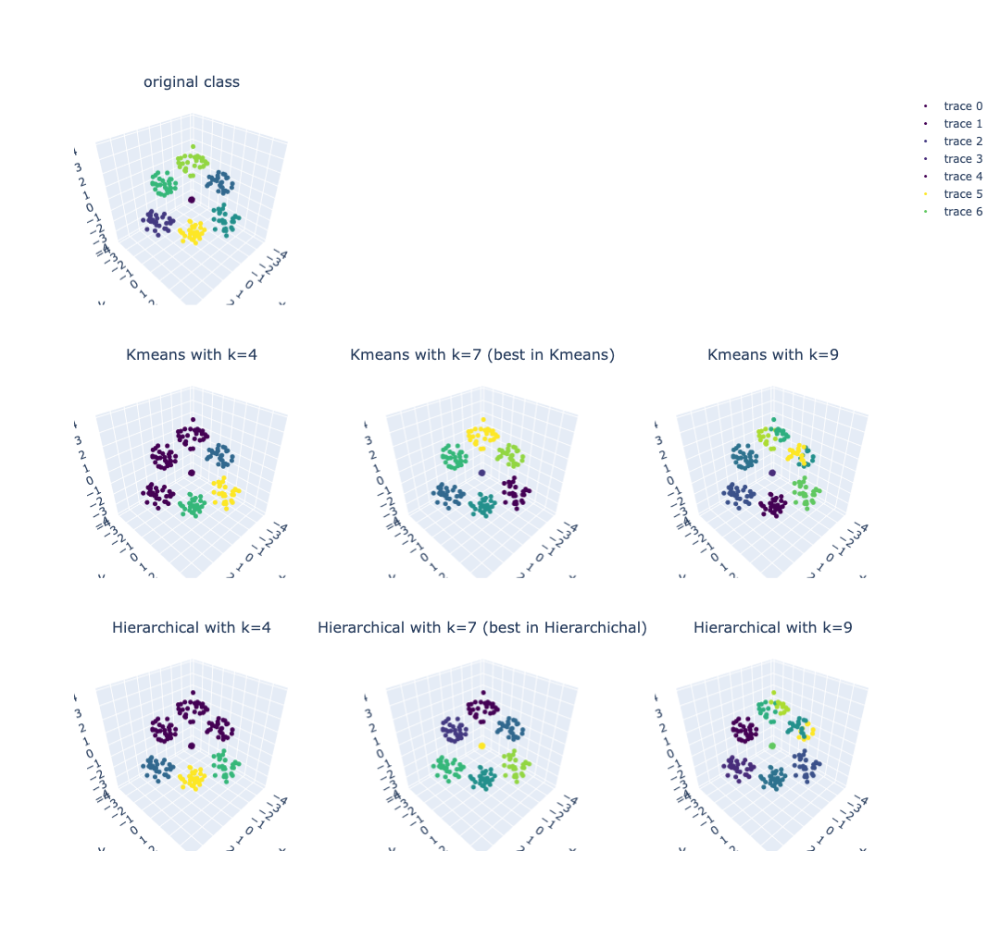

In [53]:
Ks=[4,7,9]

fig_all = make_subplots(
    rows=3, cols=3,
    subplot_titles=('original class','','','Kmeans with k=4','Kmeans with k=7 (best in Kmeans)','Kmeans with k=9','Hierarchical with k=4','Hierarchical with k=7 (best in Hierarchichal)','Hierarchical with k=9'),

    specs=[[{"type":"scene"},{"type":"scene"},{"type":"scene"}],
           [{"type":"scene"},{"type":"scene"},{"type":"scene"}],
           [{"type":"scene"},{"type":"scene"},{"type":"scene"}]],
    start_cell='top-left',
    #column_widths=[0.4,0.6],
    vertical_spacing=0.08
)
fig_all.add_trace(
    go.Scatter3d(
    x=train_data5.iloc[:,0],
    y=train_data5.iloc[:,1],
    z=train_data5.iloc[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=data5.loc[:,'Class'],
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=1,col=1
)

for i in range(len(Ks)):
    k = Ks[i]
    model = KMeans(n_clusters=k,n_init=10).fit(train_data5)
    
    fig_all.add_trace(
        go.Scatter3d(
        x=train_data5.iloc[:,0],
        y=train_data5.iloc[:,1],
        z=train_data5.iloc[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=2,col=i+1
)

for i in range(len(Ks)):
    k = Ks[i]
    model = AgglomerativeClustering(n_clusters=k).fit(train_data5)
    
    fig_all.add_trace(
        go.Scatter3d(
        x=train_data5.iloc[:,0],
        y=train_data5.iloc[:,1],
        z=train_data5.iloc[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=model.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
        row=3,col=i+1
)

fig_all.update_layout(
    autosize=False,
    width=1000,
    height=1000,
)
    
fig_all.show()

its screenshot:

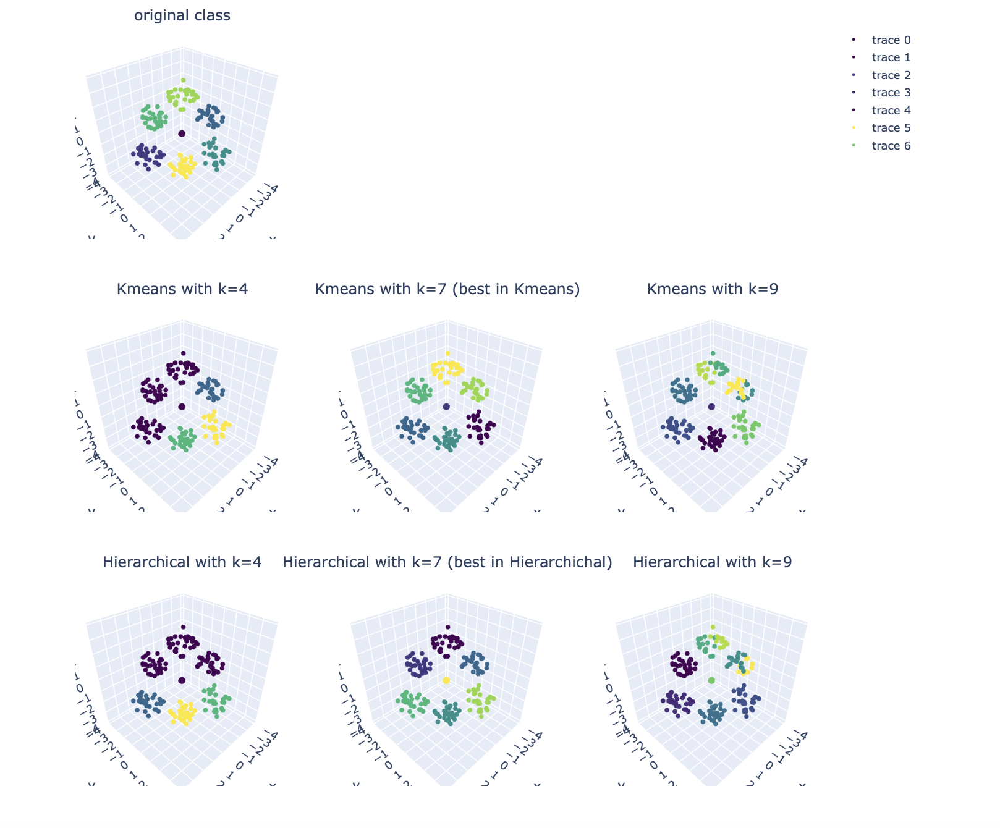

# Task 2

The world indicators dataset compares different countries based on selected attributes. Do the following tasks using the “WorldIndicators.csv” dataset posted with the project:
1. Use **K-means** and **hierarchical** clustering methods to **group similar countries together**  
2. Use **<font color=red>internal</font> validation metrics** to report the **cluster quality**  
3. Report **the best clustering solution**. Give **a detailed list** of all the groups and the countries included within the groups  
4. Generate **3 different scatter plots** of your choice and **color** the data points according to the group. (Example: “Life expectancy vs GDP”, “Infant Mortality vs GDP”, etc.)

### 0. Import and tidy data
Since there are lots of string data, we need to re-format them and turn it into float type for further analysis.

In [24]:
world = pd.read_csv('./World Indicators.csv')
world['Business Tax Rate'] = world['Business Tax Rate'].str[:-1].astype(float)
world['GDP'] = world['GDP'].str[1:].replace(',','', regex=True).astype(float)
world['Health Exp/Capita'] = world['Health Exp/Capita'].str[1:].replace(',','', regex=True).astype(float)
world.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208 entries, 0 to 207
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              199 non-null    float64
 1   Business Tax Rate       181 non-null    float64
 2   Days to Start Business  181 non-null    float64
 3   Energy Usage            136 non-null    float64
 4   GDP                     188 non-null    float64
 5   Health Exp % GDP        185 non-null    float64
 6   Health Exp/Capita       185 non-null    float64
 7   Hours to do Tax         180 non-null    float64
 8   Infant Mortality Rate   188 non-null    float64
 9   Internet Usage          199 non-null    float64
 10  Lending Interest        131 non-null    float64
 11  Life Expectancy Female  197 non-null    float64
 12  Life Expectancy Male    197 non-null    float64
 13  Mobile Phone Usage      196 non-null    float64
 14  Population 0-14         191 non-null    fl

We can see that there's a lot of missing data. To fill all the nas we use the imputer to fit the space with mode value. We choose mode because the average value will be affect a lot by outliers.

In [26]:
cols = world.columns.values.tolist()
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent') 
imputer = imputer.fit(world) 
  
worldFill = imputer.transform(world) 
worldFill = pd.DataFrame(worldFill)
worldFill.columns = cols
worldFill = worldFill.set_index(['Region','Country'])
worldFill.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 208 entries, ('Africa', 'Algeria') to ('The Americas', 'Virgin Islands (U.S.)')
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Birth Rate              208 non-null    object
 1   Business Tax Rate       208 non-null    object
 2   Days to Start Business  208 non-null    object
 3   Energy Usage            208 non-null    object
 4   GDP                     208 non-null    object
 5   Health Exp % GDP        208 non-null    object
 6   Health Exp/Capita       208 non-null    object
 7   Hours to do Tax         208 non-null    object
 8   Infant Mortality Rate   208 non-null    object
 9   Internet Usage          208 non-null    object
 10  Lending Interest        208 non-null    object
 11  Life Expectancy Female  208 non-null    object
 12  Life Expectancy Male    208 non-null    object
 13  Mobile Phone Usage      208 non-null    object
 14  

### 1a. Using k-means clustering method to group similiar countries
We are still using the same three coefficient to determine the k-value.

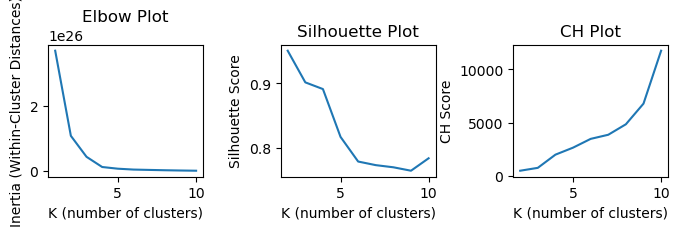

In [146]:
inertias = []
silhouettes = []
ch_coeffs = []

for k in range(1,11):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(worldFill)
    inertias.append(kmeans.inertia_)
    if k > 1:
      silhouettes.append(metrics.silhouette_score(worldFill, kmeans.labels_))
      ch_coeffs.append(metrics.calinski_harabasz_score(worldFill, kmeans.labels_))

plt.figure(figsize = (8,6))
grid = plt.GridSpec(2,3,wspace=0.5,hspace=1.5)

plt.subplot(grid[0,0])
plt.plot(range(1,11), inertias)
plt.xlabel("K (number of clusters)")
plt.ylabel("Inertia (Within-Cluster Distances)")
plt.title("Elbow Plot")

plt.subplot(grid[0,1])
plt.plot(range(2,11), silhouettes)
plt.xlabel("K (number of clusters)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Plot")

plt.subplot(grid[0,2])
plt.plot(range(2,11), ch_coeffs)
plt.xlabel("K (number of clusters)")
plt.ylabel("CH Score")
plt.title("CH Plot")

plt.show()

The plot for CH values tells us the higher the better. But as same time we can see there's a lowest point for sihouette value at k=9. So we'll take the value of 9.

In [27]:
modelK = KMeans(n_clusters=9, n_init=10)
modelK.fit(worldFill)

KMeans(n_clusters=9, n_init=10)

### 1b. Using hierarchical clustering method to group similiar countries

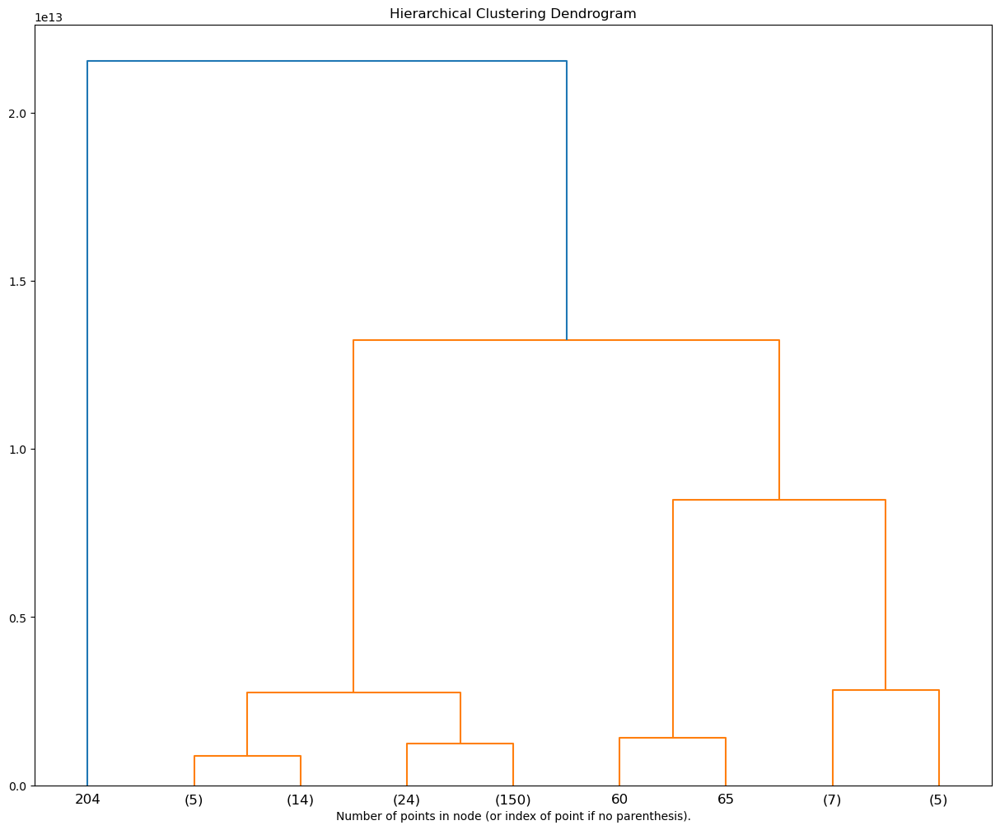

In [28]:
model6 = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model6 = model6.fit(worldFill)
plt.figure(figsize=(15,12))
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model6, truncate_mode="level", p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

From the graph we can see that there are 204 countries that are really different from others. So we'd better make the other groups more distinct. It's better to group them into 6 groups.

In [29]:
modelH = AgglomerativeClustering(n_clusters=6)
modelH.fit(worldFill)

AgglomerativeClustering(n_clusters=6)

### 2. Use internal validation metrics to report the cluster quality
We are using three internal coefficients to evaluate the performace of both method.

In [31]:
pd.concat([performance_internal(worldFill, modelK.labels_, ['KMeans']),performance_internal(worldFill, modelH.labels_, ['Hierarchical'])])

,Group Sum of Square,Calinski-Harabasz coefficient,Dunn Index
KMeans,0.777785,7431.038142,0.273237
Hierarchical,0.782092,3457.529439,0.381222


Both clustering method have a similiar sum of square value. But K-means has a much higher CH value and a lower dunn value. So it gives better grouping result.

### 3. list of all the groups and the countries included within the groups

In [32]:
worldFill['Class'] = modelK.labels_
worldClass = worldFill.reset_index().set_index(['Class','Country']).index.to_frame(index=False)
for i in range(9):
    li = worldClass.loc[worldClass['Class'] == i].loc[:,'Country'].to_list()
    print("Class " + str(i) + " :")
    print(li)

Class 0 :
['Indonesia', 'Belgium', 'Netherlands', 'Norway', 'Poland', 'Sweden', 'Switzerland', 'Turkey', 'Iran, Islamic Rep.', 'Saudi Arabia', 'Argentina']
Class 1 :
['China']
Class 2 :
['Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire", 'Djibouti', 'Equatorial Guinea', 'Eritrea', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Rwanda', 'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Sudan', 'Sudan', 'Swaziland', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe', 'Afghanistan', 'Armenia', 'Azerbaijan', 'Bangladesh', 'Bhutan', 'Brunei Darussalam', 'Cambodia', 'Georgia', 'Korea, Dem. Rep.', 'Kyrgyz Republic', 'Lao PDR', 'Macao SAR, China', 'Maldives', 'Mongol

### 4. Plot to compare the data.
We choose to plot graph on "Urban population and birth rate", "Intnet usage and mobile phone usage" and "Business and GDP".

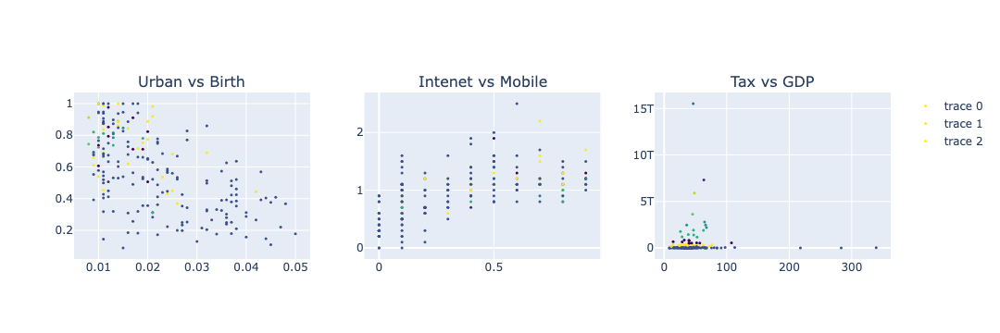

In [33]:
figW = make_subplots(
    rows=1, cols=3,
    subplot_titles=('Urban vs Birth','Intenet vs Mobile','Tax vs GDP'),
    specs=[[{"type":"xy"},{"type":"xy"},{"type":"xy"}]]
)
figW.add_trace(
    go.Scatter(
    x=worldFill.iloc[:,0],
    y=worldFill.iloc[:,17],
    mode='markers',
    marker=dict(
        size=3,
        color=modelK.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=1
)
figW.add_trace(
    go.Scatter(
    x=worldFill.iloc[:,9],
    y=worldFill.iloc[:,13],
    mode='markers',
    marker=dict(
        size=3,
        color=modelK.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=2
)
figW.add_trace(
    go.Scatter(
    x=worldFill.iloc[:,1],
    y=worldFill.iloc[:,4],
    mode='markers',
    marker=dict(
        size=3,
        color=modelK.labels_,
        colorscale='Viridis',
        opacity=1
        )
    ),
    row=1,col=3
)
figW.update_layout()
figW.show()

Submission Format  
1. Submit all solutions as either an iPython notebook (.ipynb) showing all solutions OR as a PDF  
2. Include text to explain the solution (don’t just show the numbers, tell what you did!)  
3. Include equations for the evaluation metrics in your submission file   
4. Use modules in Python that provide functions for different clustering methods and cluster validation  
5. Students can also create their own custom functions if necessary  
6. This is a group effort! All members of the group should actively participate and contribute to the final solution  
7. Only 1 member from each group needs to submit the solution; be sure that all group member names are listed on your submission file  
8. Submit the solution by November 28th at 12 PM PT.  